In [ ]:
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

In [ ]:
img_array=cv2.imread("Train/Open_Eyes/s0012_08716_0_0_1_1_0_02.png",cv2.IMREAD_GRAYSCALE)

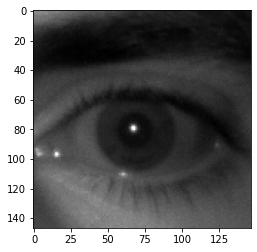

In [ ]:
plt.imshow(img_array,cmap="gray")

In [ ]:
Datadirectory="Train/"
Classes=["Closed_Eyes","Open_Eyes"]
img_size=224

In [ ]:
training_Data=[]
def create_training_Data():
    for category in Classes:
        path = os.path.join(Datadirectory,category)
        class_num=Classes.index(category)
        for img in os.listdir(path):
            try:
                img_array=cv2.imread(os.path.join(path,img),cv2.IMREAD_GRAYSCALE)
                backtorgb=cv2.cvtColor(img_array,cv2.COLOR_GRAY2RGB)
                new_array=cv2.resize(backtorgb,(img_size,img_size))
                training_Data.append([new_array,class_num])
            except Exception as e:
                pass                                     

In [ ]:
create_training_Data()

In [ ]:
print(len(training_Data))

3600


In [ ]:
import random
random.shuffle(training_Data)

In [ ]:
X=[]
y=[]
for features,label in training_Data:
    X.append(features)
    y.append(label)
X=np.array(X).reshape(-1,img_size,img_size,3)
Y=np.array(y)

In [ ]:
X.shape

(3600, 224, 224, 3)

In [ ]:
X=X/255.0;

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
model=tf.keras.applications.mobilenet.MobileNet()

In [ ]:
model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32

In [ ]:
base_input=model.layers[0].input

In [ ]:
base_output=model.layers[-4].output

In [ ]:
Flat_layer=layers.Flatten()(base_output)
final_output=layers.Dense(1)(Flat_layer)
final_output=layers.Activation('sigmoid')(final_output)

In [ ]:
new_model=keras.Model(inputs=base_input,outputs=final_output)

In [ ]:
new_model.compile(loss="binary_crossentropy",optimizer="adam",metrics=["accuracy"])

In [ ]:
new_model.fit(X,Y,epochs=1,validation_split=0.1)

102/102 [==============================] - 565s 5s/step - loss: 0.0139 - accuracy: 0.9923 - val_loss: 2.0786e-06 - val_accuracy: 1.0000


In [ ]:
new_model.save('my_model.h5')

In [ ]:
import tensorflow as tf
new_model=tf.keras.models.load_model('my_model.h5')

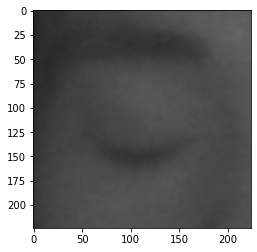

close


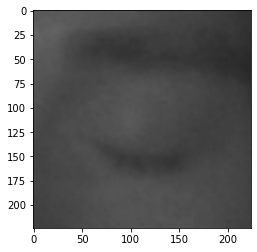

close


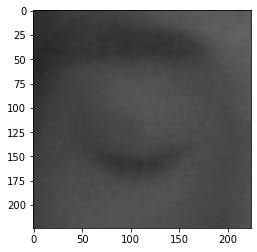

close


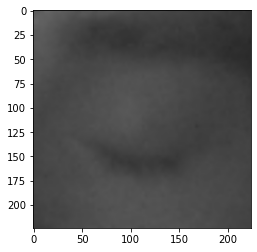

close


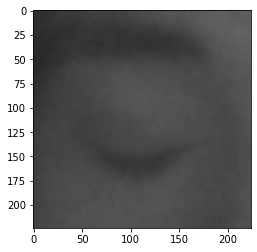

close


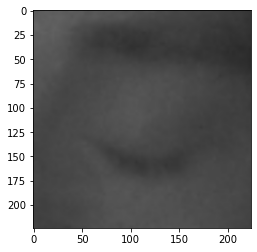

close


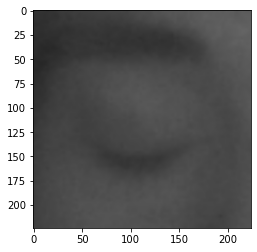

close


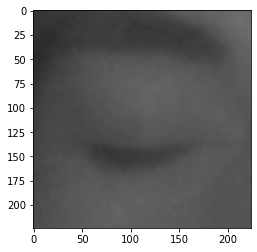

close


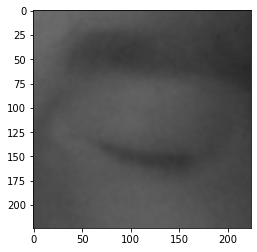

close


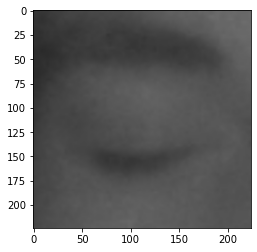

close


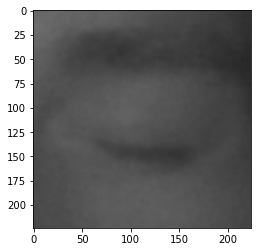

close


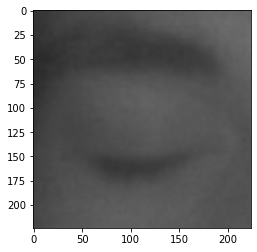

close


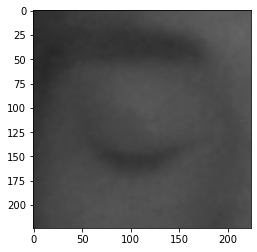

close


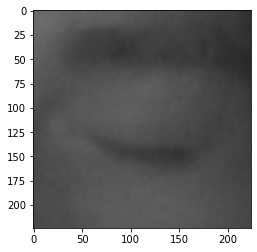

close


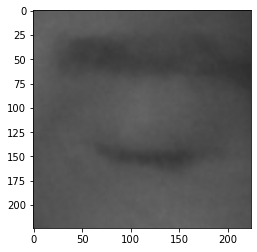

close


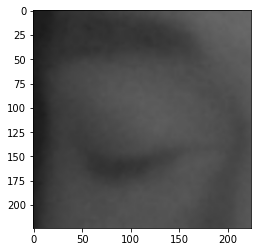

close


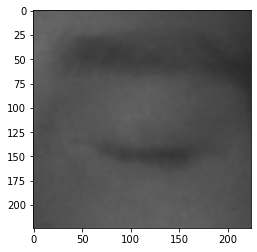

close


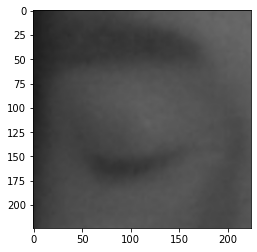

close


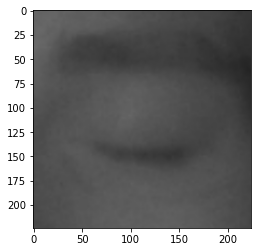

close


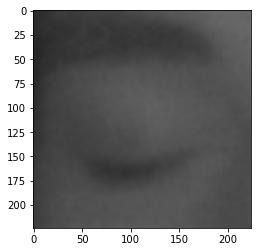

close


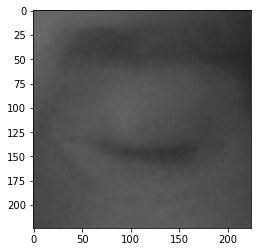

close


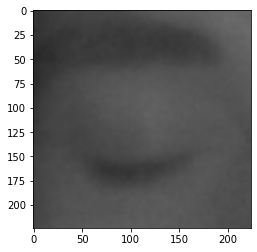

close


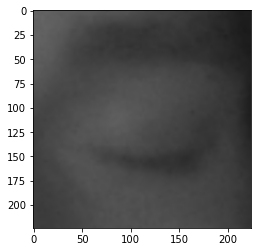

close


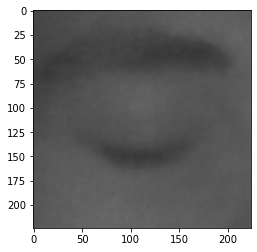

close


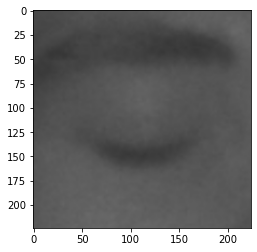

close


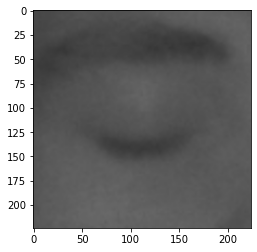

close


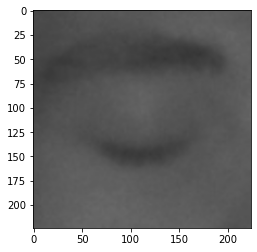

close


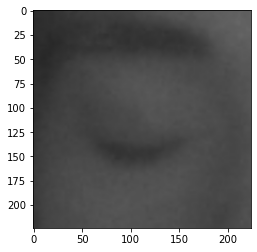

close


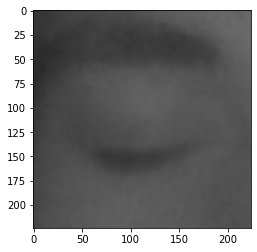

close


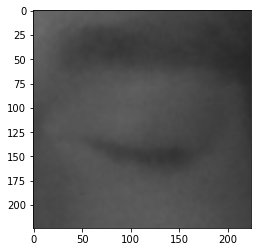

close


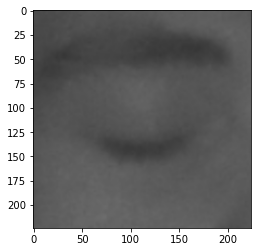

close


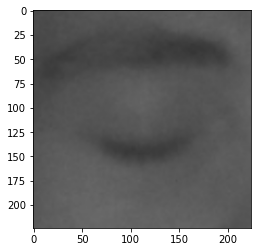

close


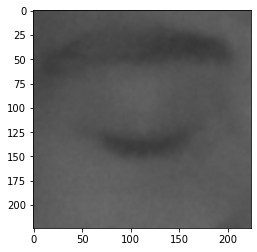

close


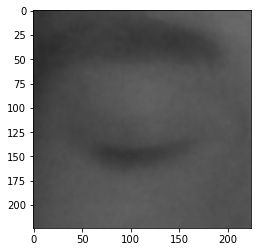

close


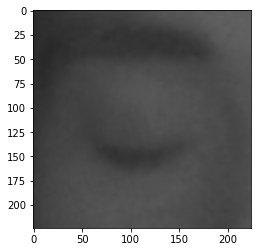

close


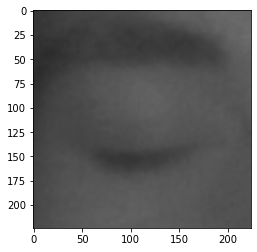

close


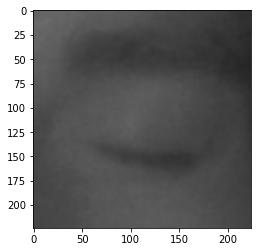

close


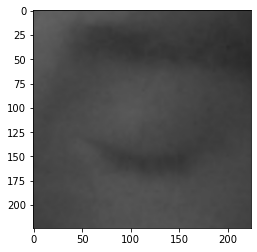

close


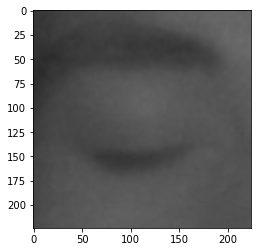

close


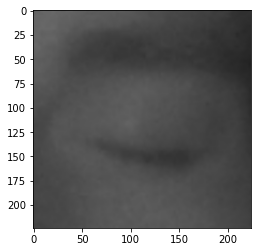

close


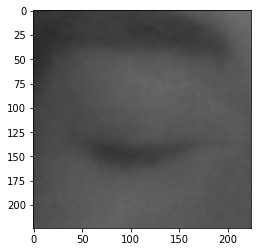

close


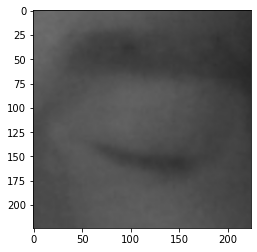

close


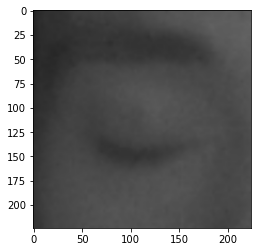

close


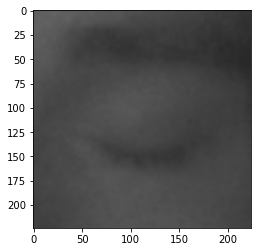

close


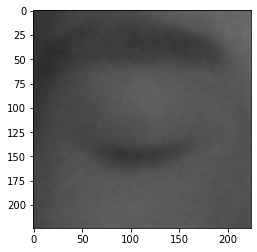

close


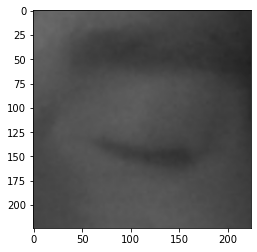

close


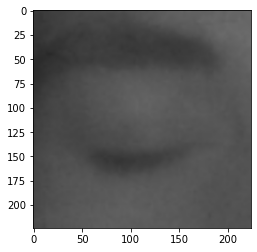

close


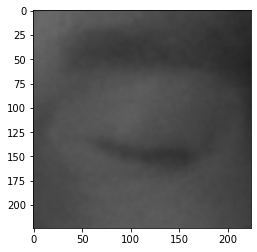

close


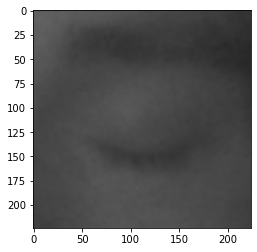

close


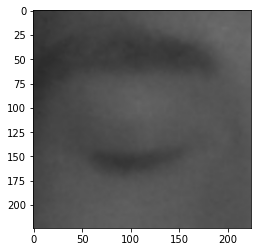

close


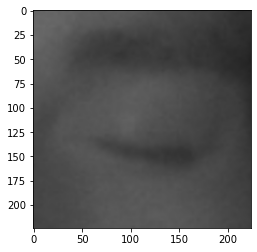

close


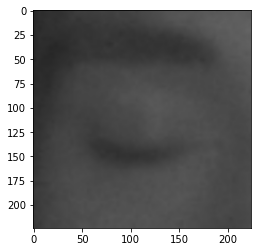

close


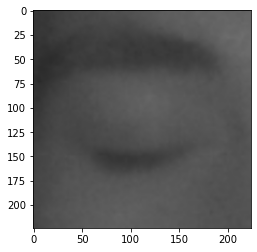

close


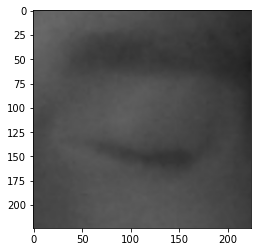

close


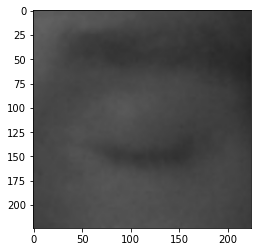

close


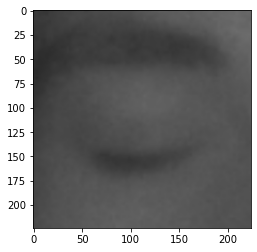

close


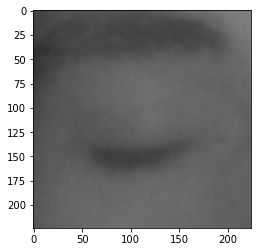

close


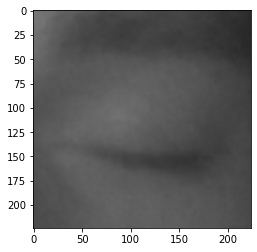

close


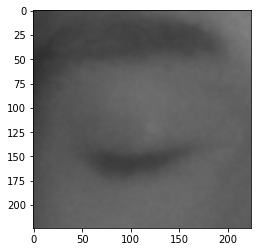

close


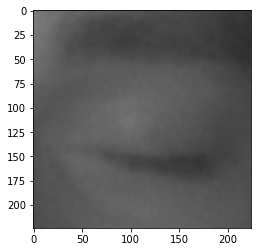

close


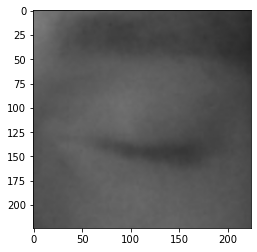

close


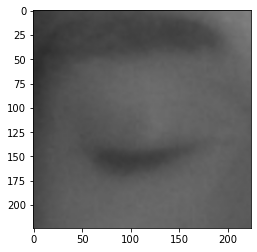

close


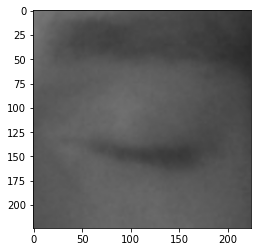

close


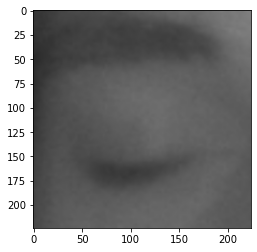

close


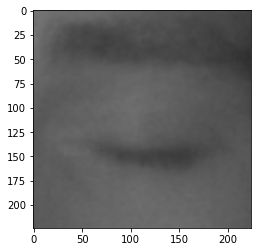

close


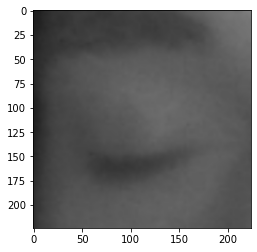

close


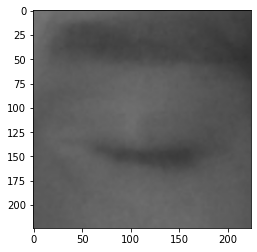

close


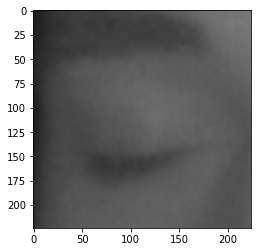

close


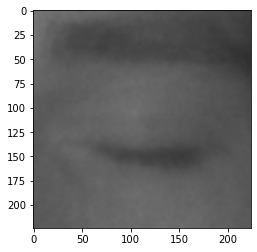

close


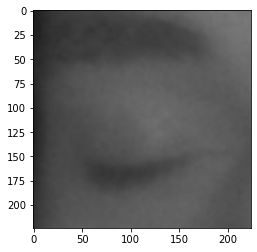

close


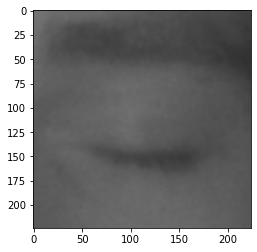

close


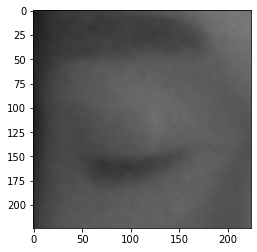

close


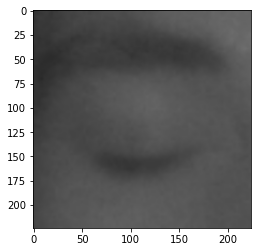

close


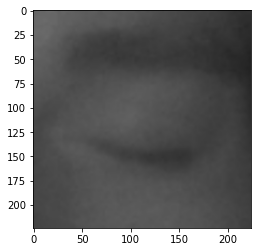

close


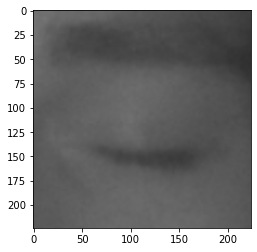

close


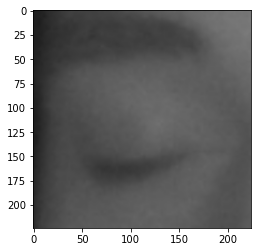

close


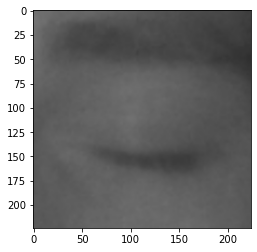

close


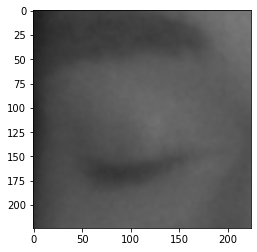

close


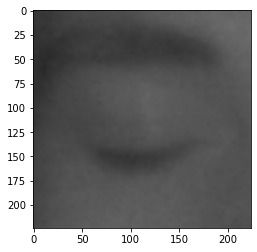

close


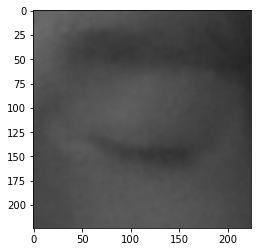

close


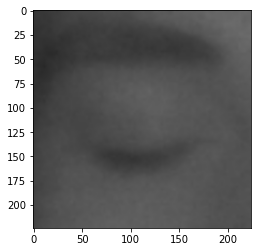

close


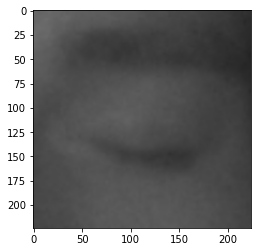

close


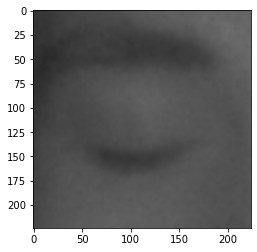

close


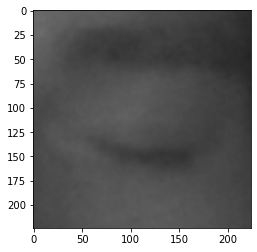

close


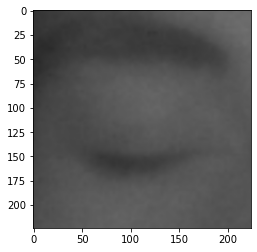

close


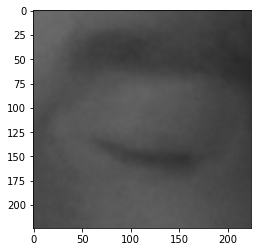

close


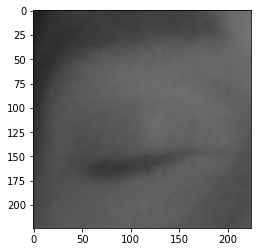

close


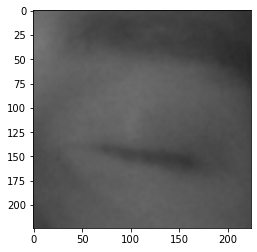

close


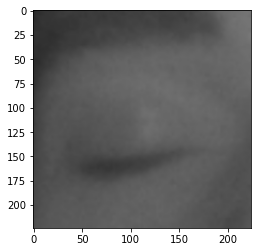

close


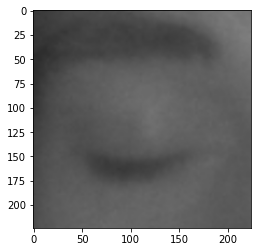

close


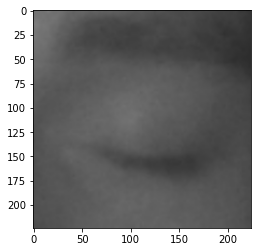

close


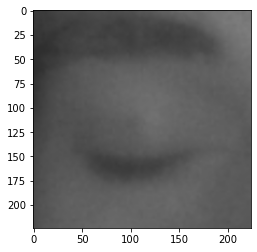

close


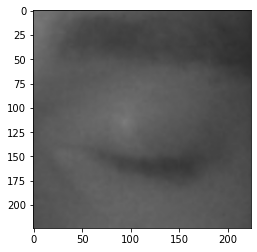

close


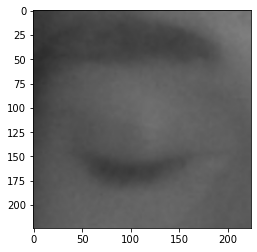

close


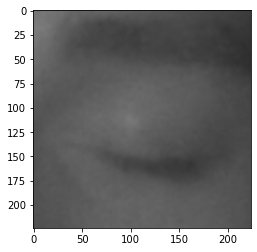

close


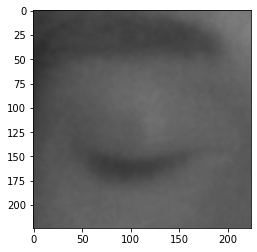

close


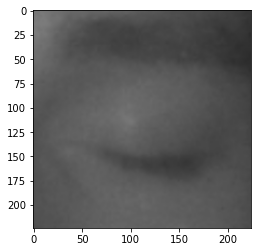

close


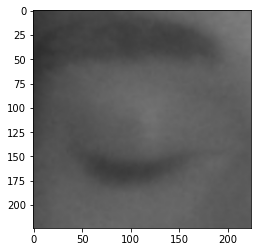

close


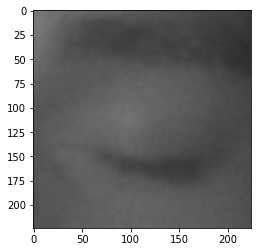

close


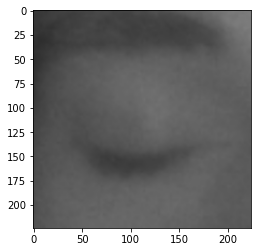

close


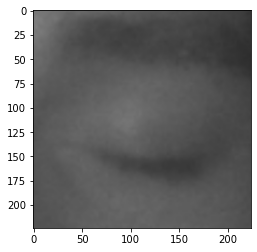

close


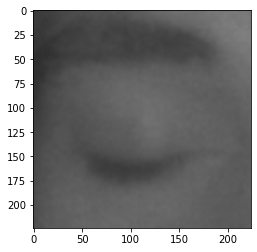

close


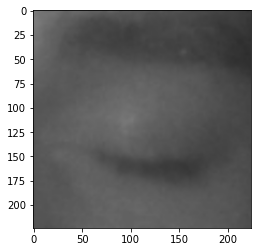

close


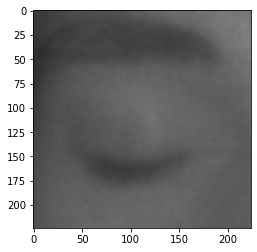

close


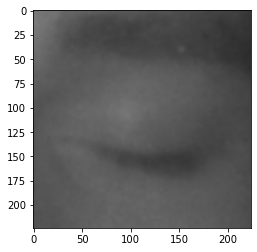

close


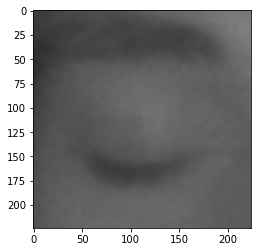

close


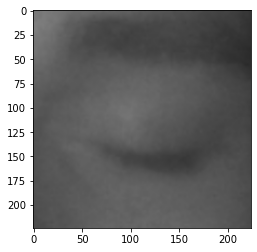

close


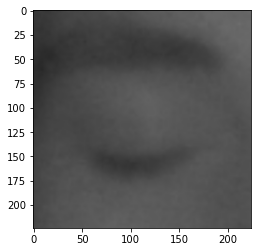

close


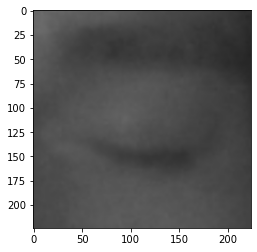

close


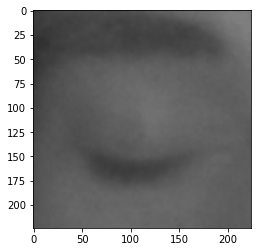

close


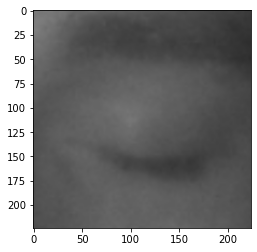

close


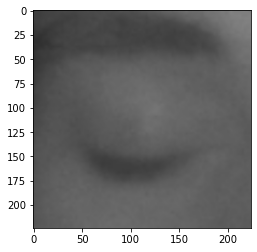

close


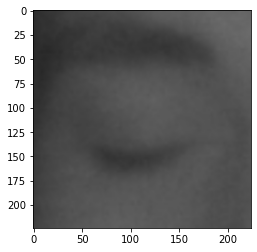

close


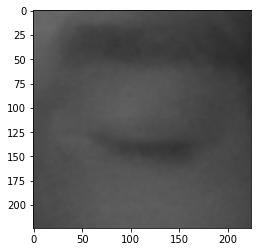

close


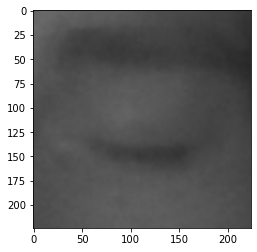

close


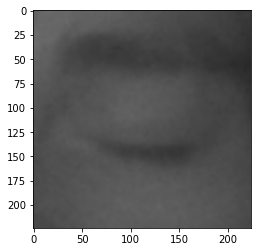

close


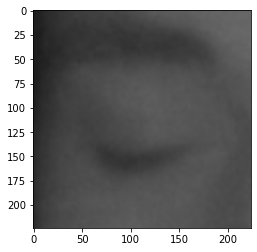

close


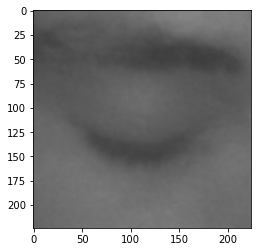

close


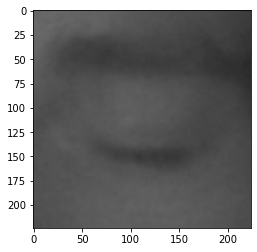

close


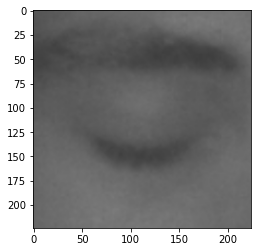

close


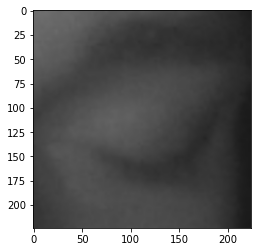

close


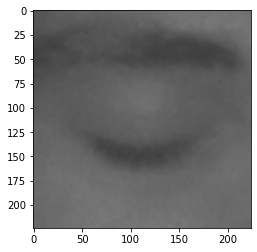

close


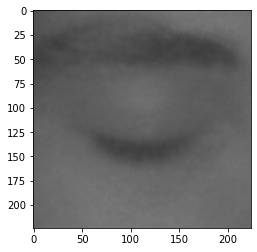

close


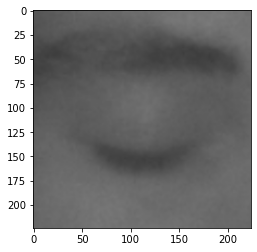

close


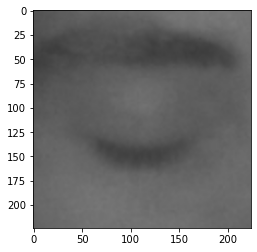

close


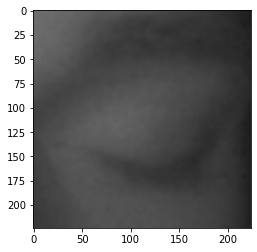

close


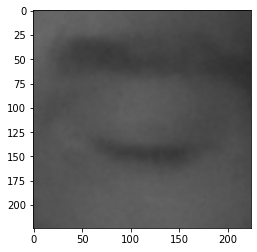

close


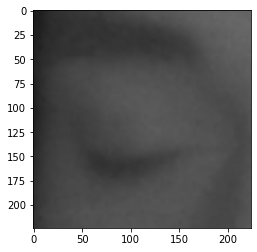

close


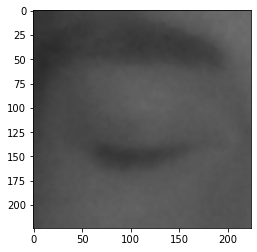

close


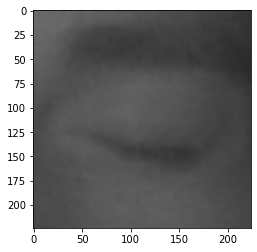

close


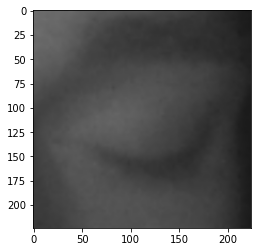

close


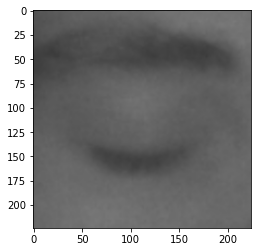

close


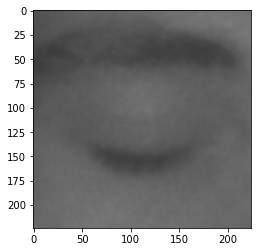

close


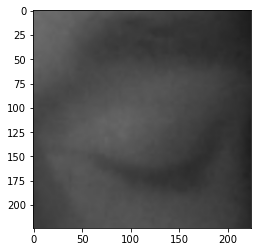

close


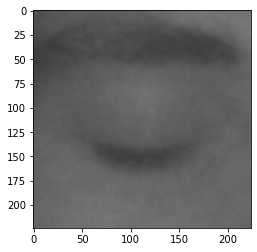

close


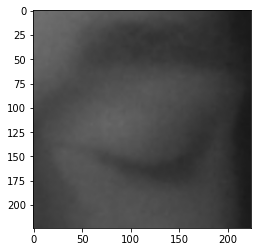

close


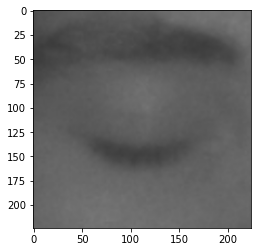

close


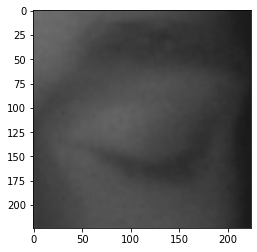

close


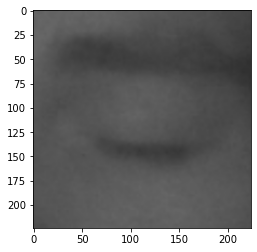

close


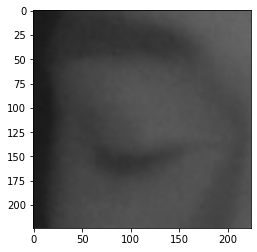

close


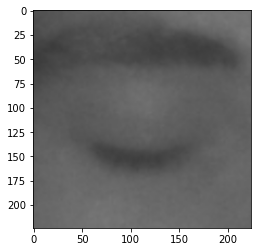

close


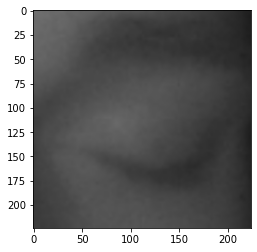

close


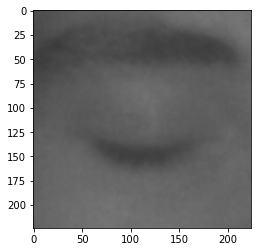

close


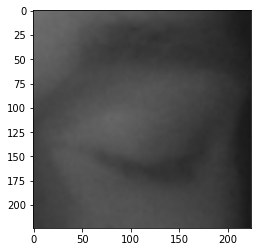

close


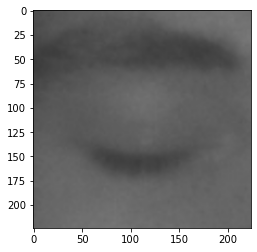

close


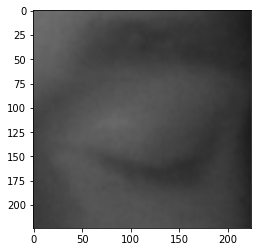

close


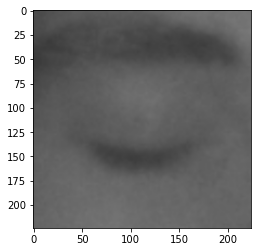

close


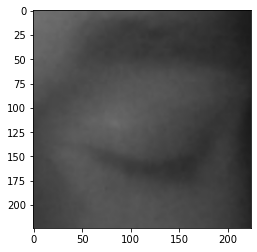

close


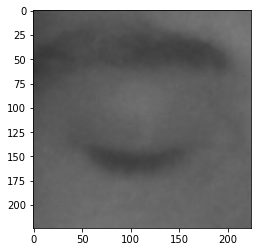

close


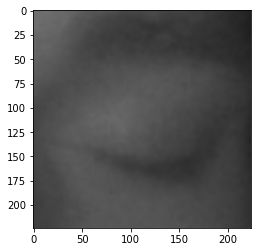

close


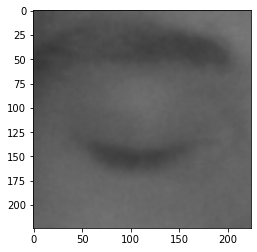

close


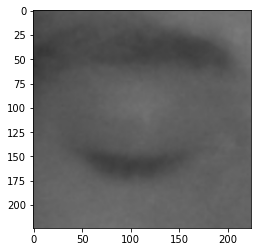

close


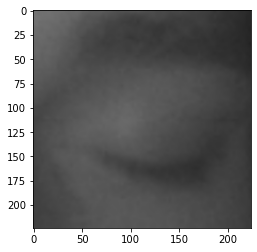

close


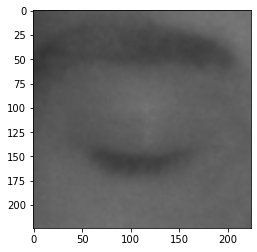

close


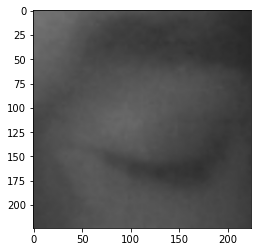

close


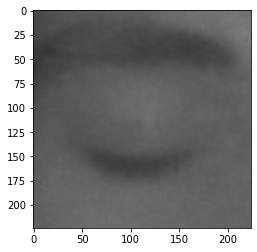

close


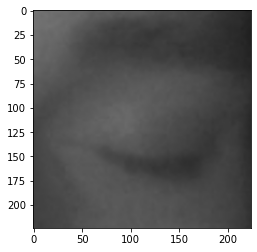

close


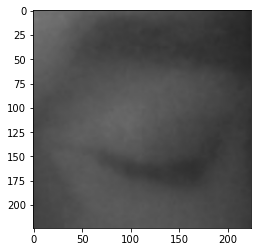

close


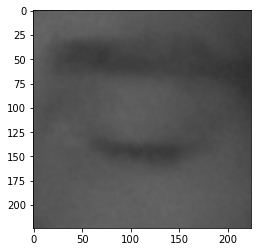

close


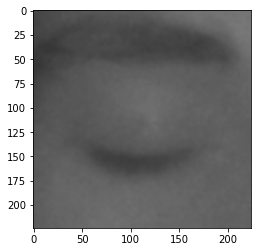

close


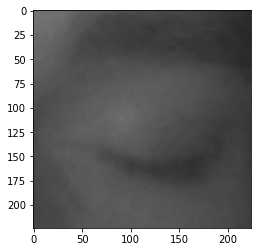

close


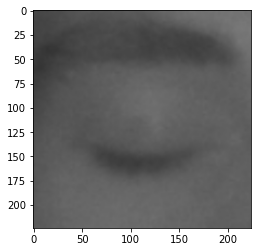

close


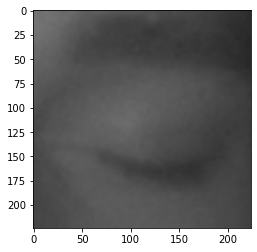

close


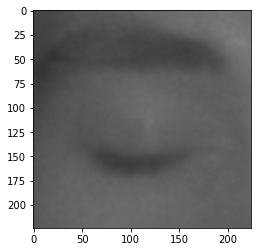

close


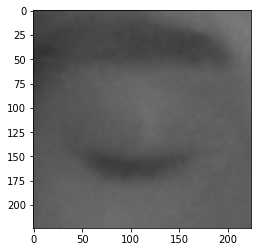

close


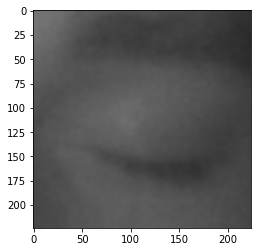

close


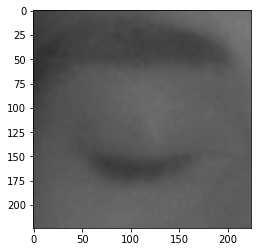

close


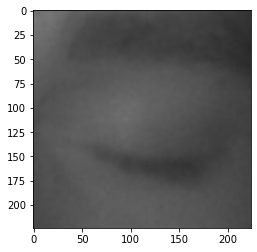

close


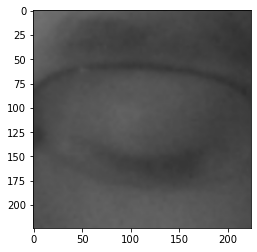

close


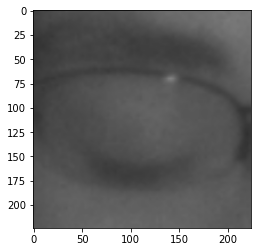

close


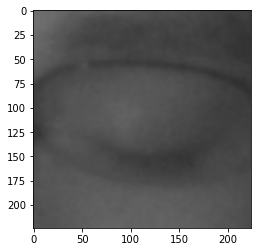

close


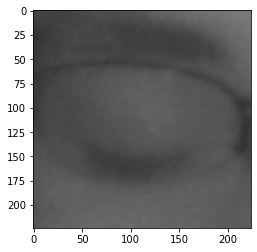

close


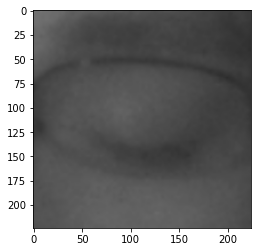

close


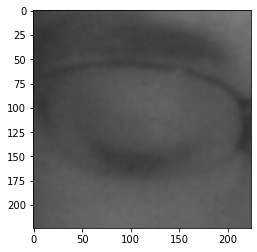

close


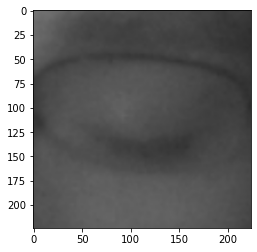

close


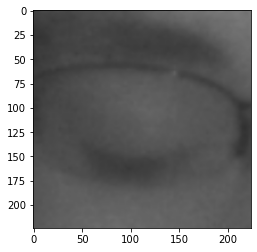

close


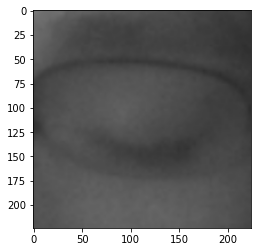

close


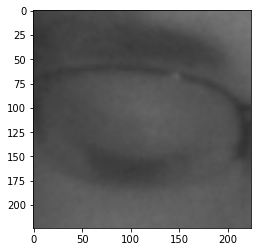

close


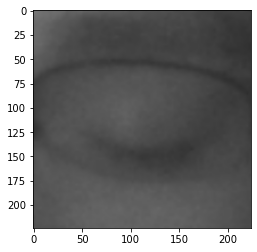

close


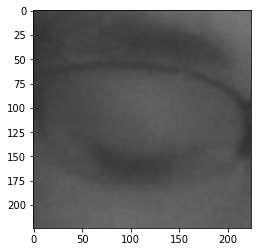

close


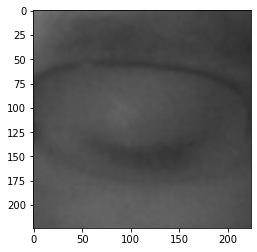

close


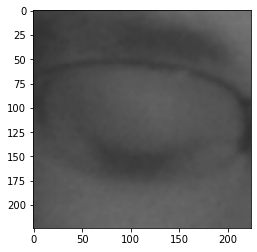

close


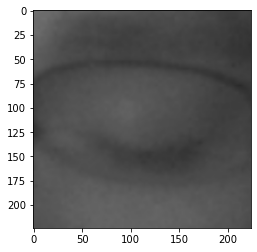

close


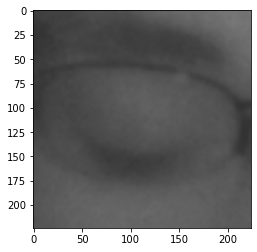

close


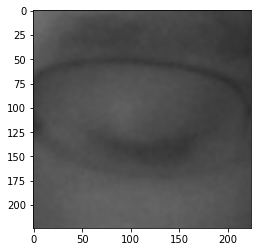

close


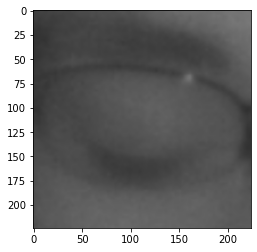

close


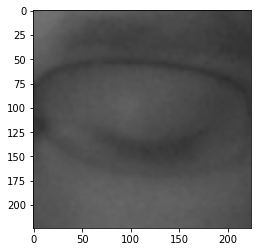

close


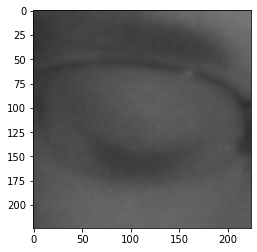

close


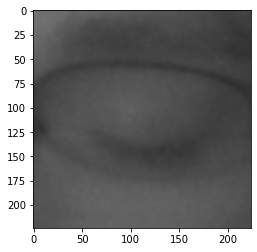

close


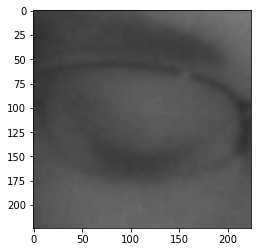

close


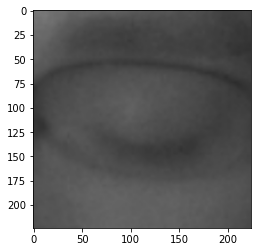

close


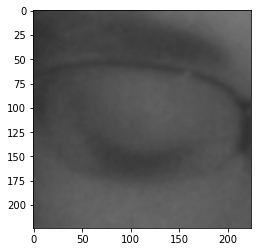

close


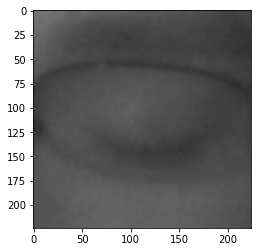

close


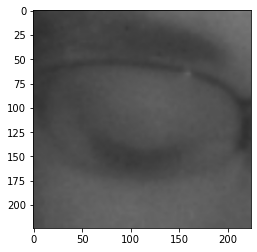

close


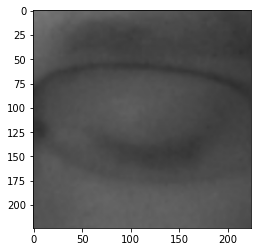

close


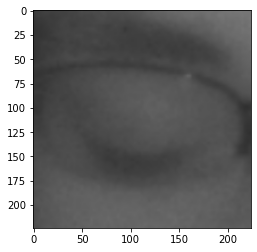

close


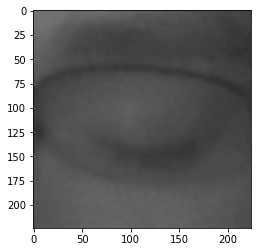

close


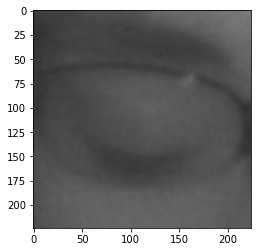

close


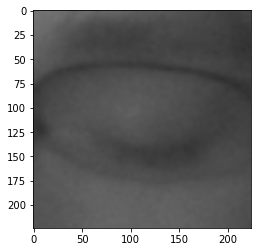

close


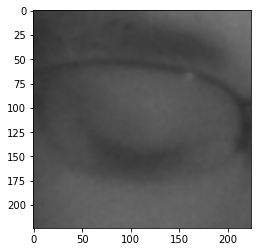

close


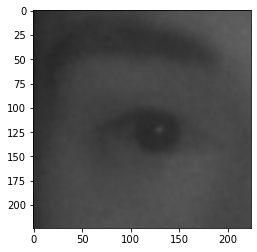

Open


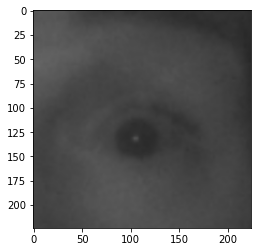

Open


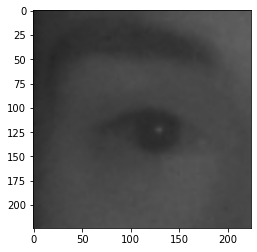

close


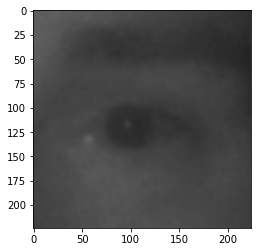

close


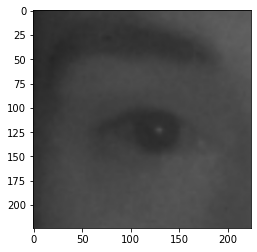

close


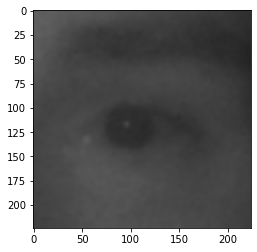

Open


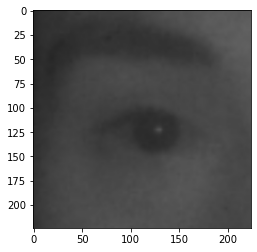

close


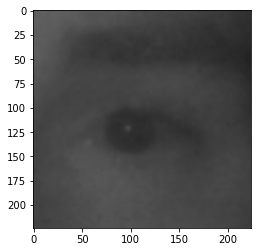

close


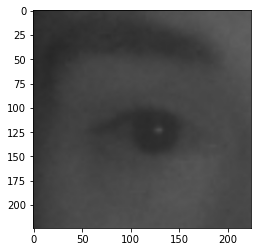

close


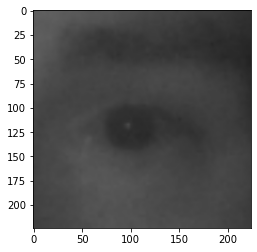

close


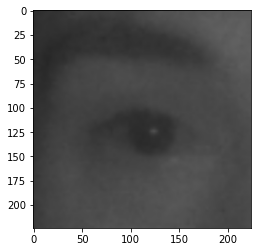

close


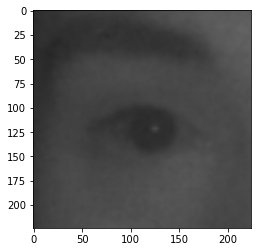

close


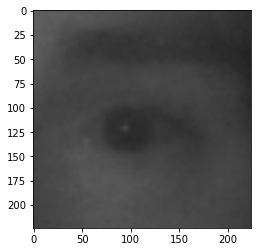

Open


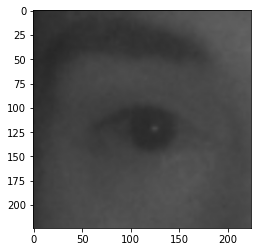

close


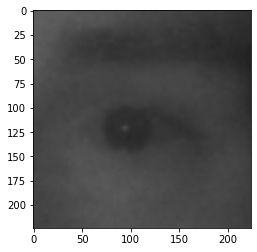

close


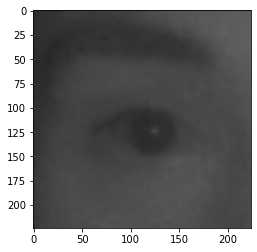

close


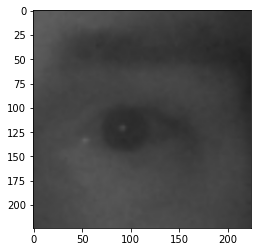

close


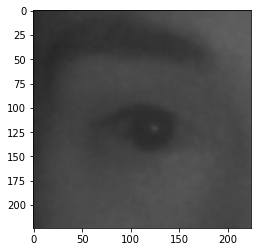

close


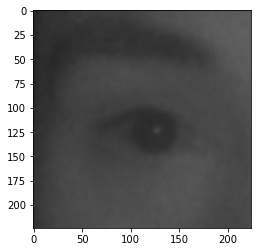

close


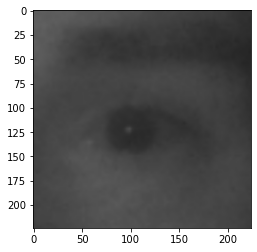

close


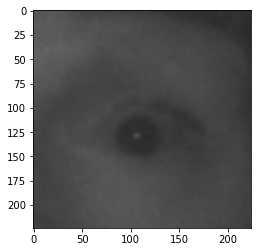

Open


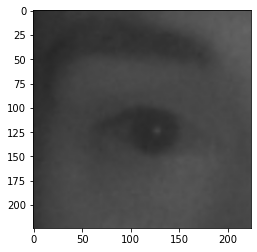

close


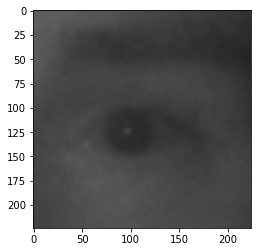

Open


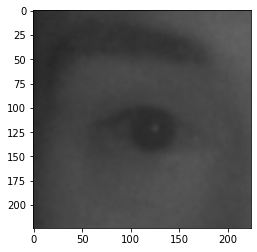

close


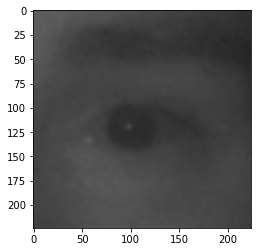

Open


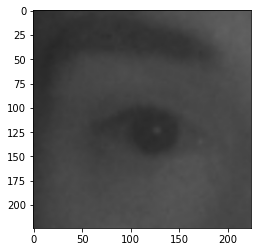

close


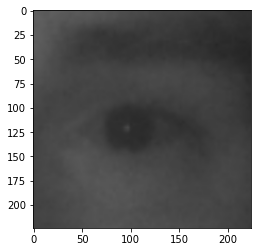

close


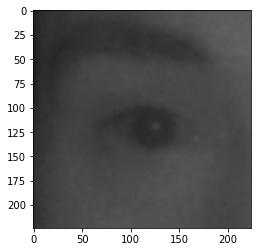

close


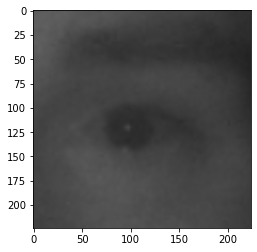

close


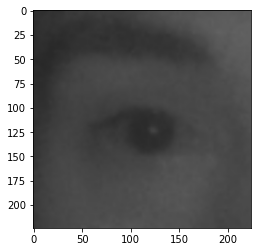

close


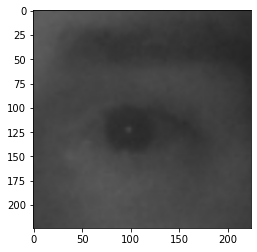

close


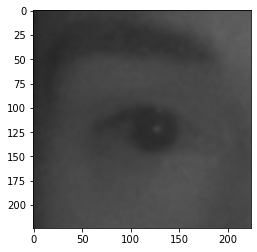

close


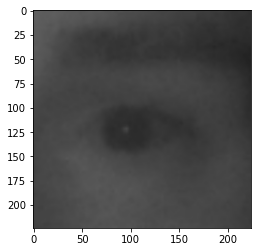

close


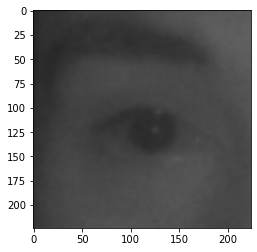

close


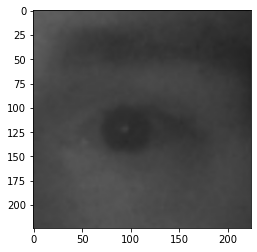

close


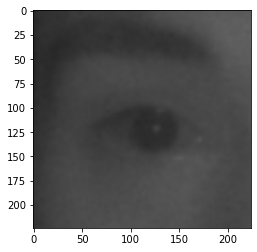

close


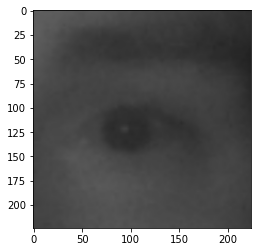

close


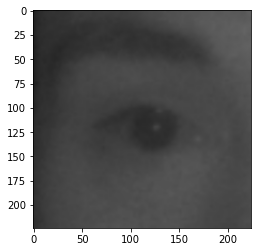

close


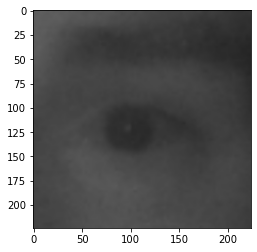

close


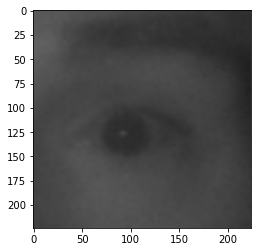

close


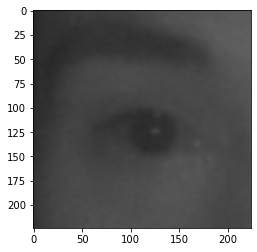

close


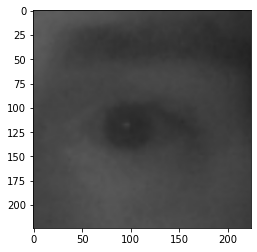

close


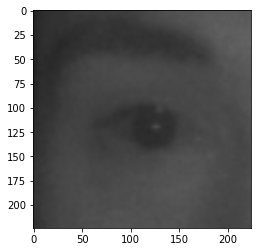

close


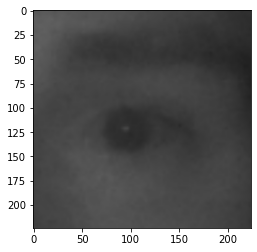

close


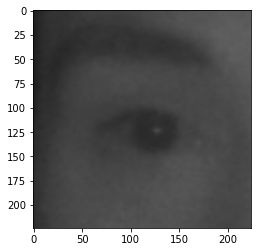

close


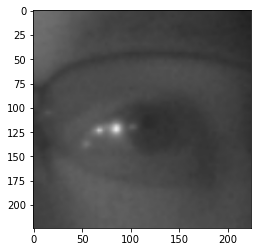

Open


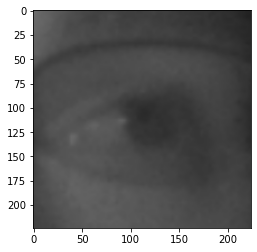

close


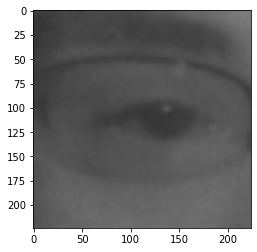

close


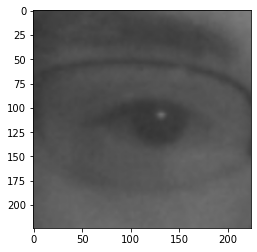

Open


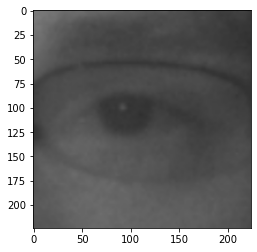

Open


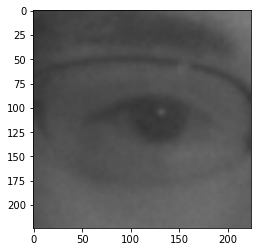

Open


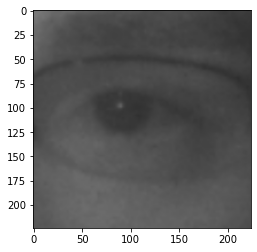

Open


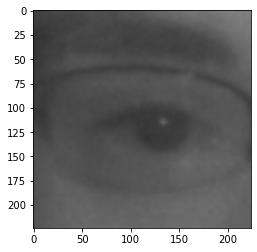

Open


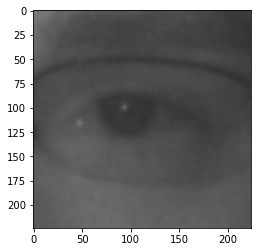

Open


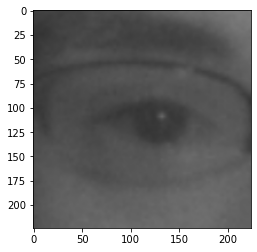

Open


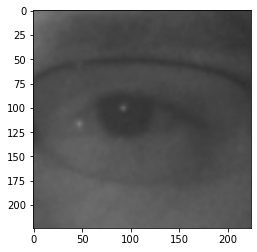

Open


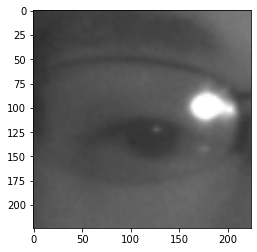

Open


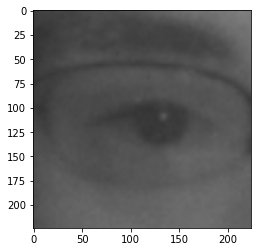

Open


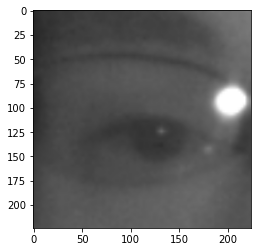

Open


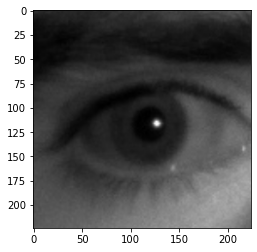

Open


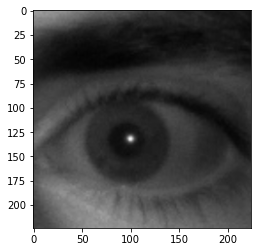

Open


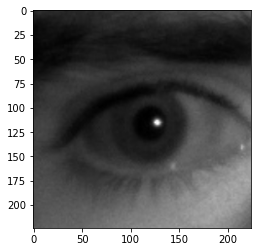

Open


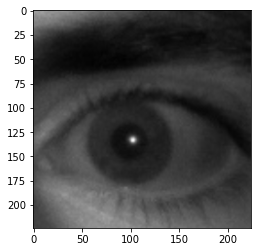

Open


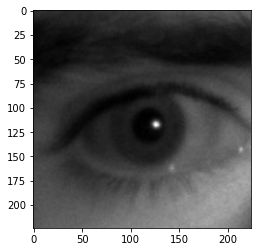

Open


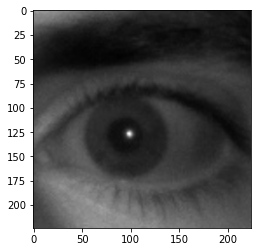

Open


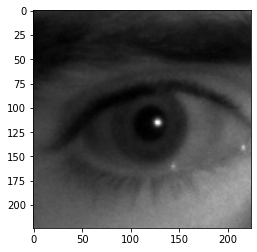

Open


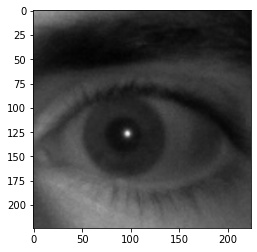

Open


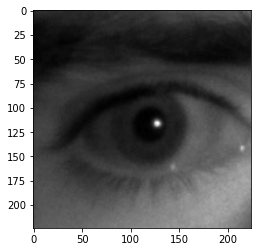

Open


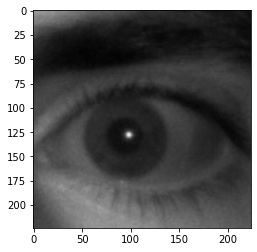

Open


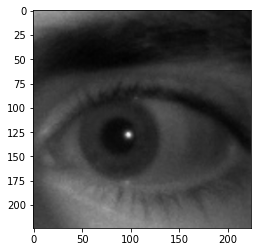

Open


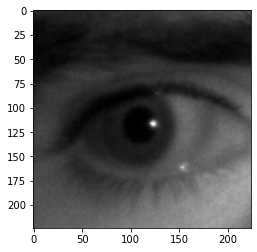

Open


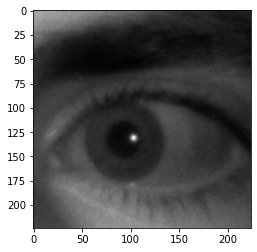

Open


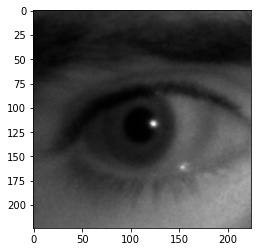

Open


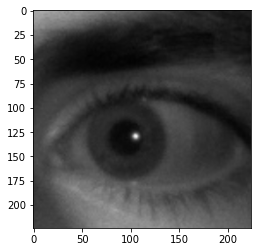

Open


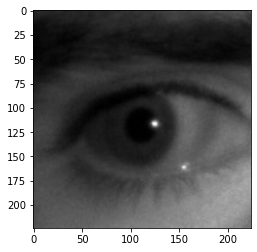

Open


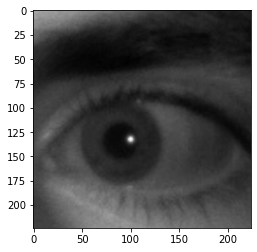

Open


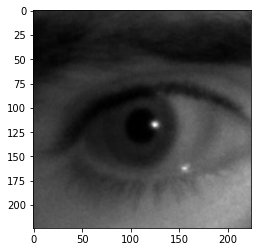

Open


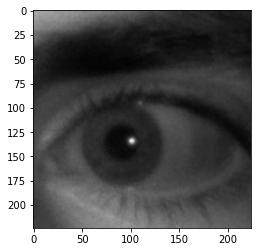

Open


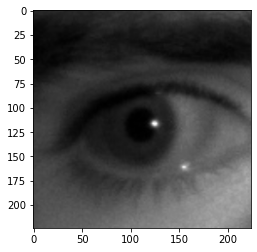

Open


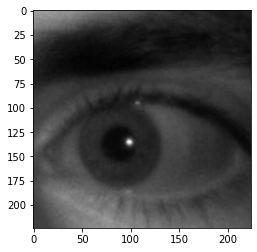

Open


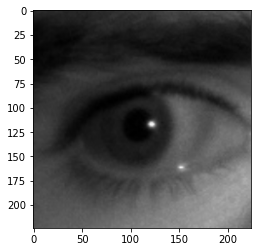

Open


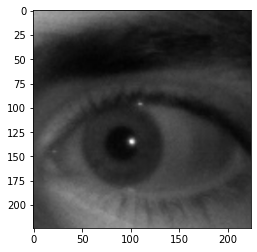

Open


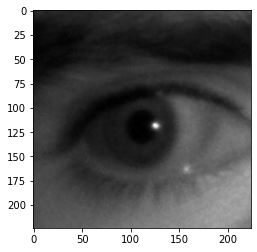

Open


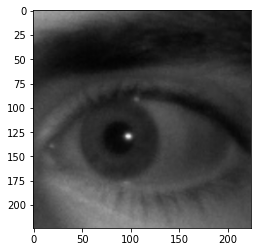

Open


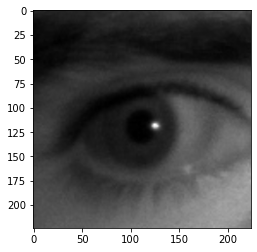

Open


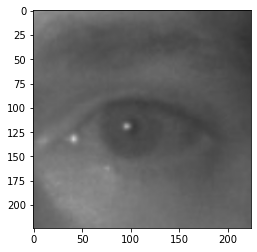

Open


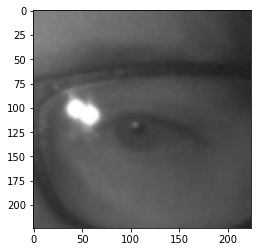

Open


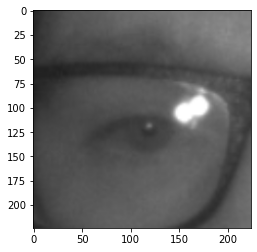

close


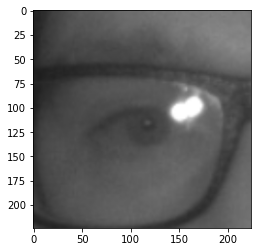

close


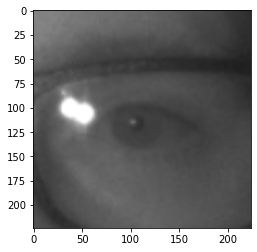

Open


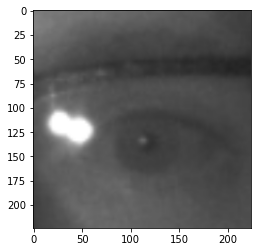

Open


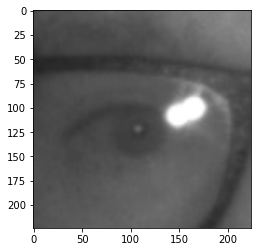

close


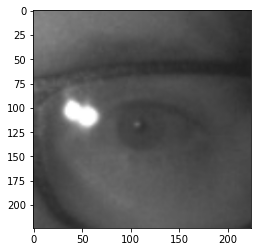

Open


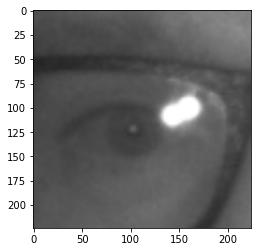

close


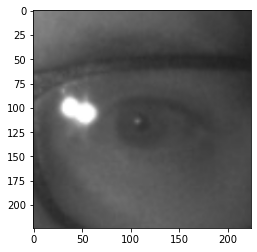

Open


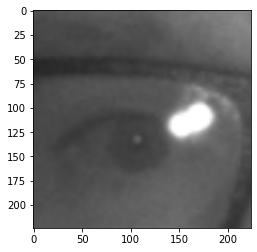

Open


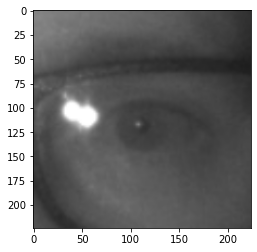

Open


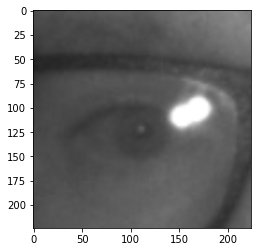

close


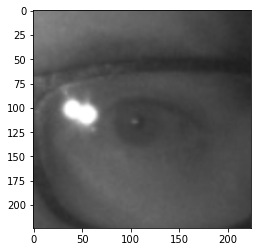

Open


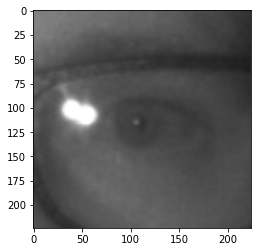

Open


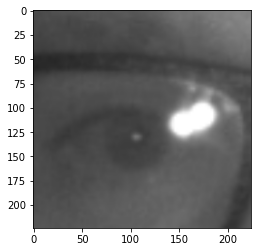

Open


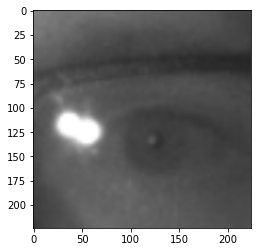

Open


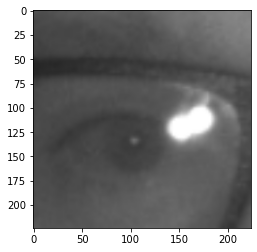

Open


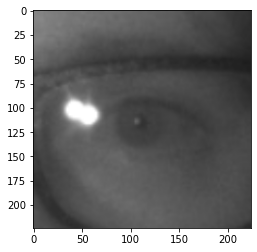

Open


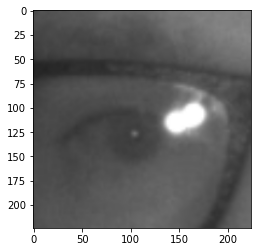

Open


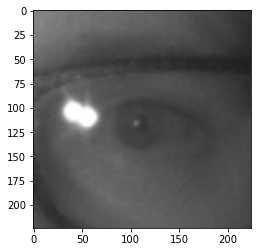

Open


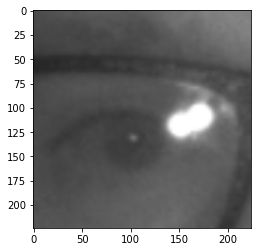

Open


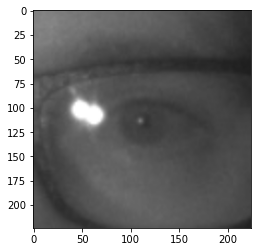

Open


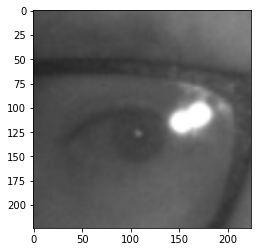

Open


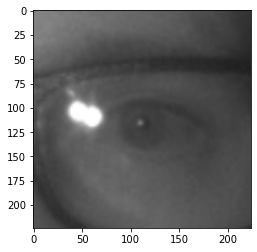

Open


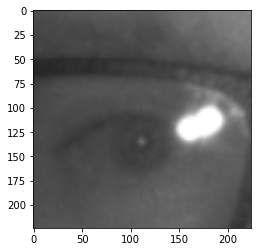

Open


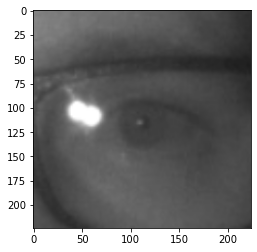

Open


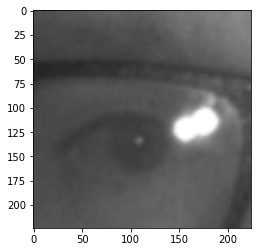

Open


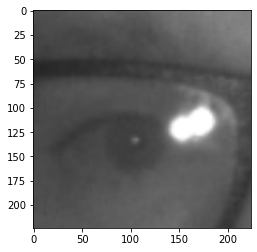

Open


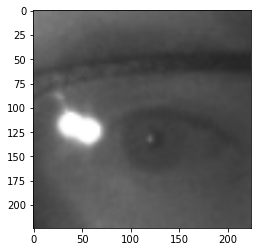

Open


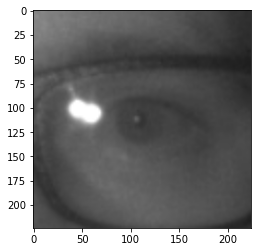

Open


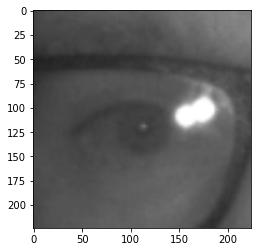

close


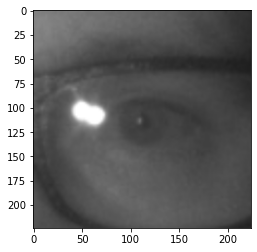

Open


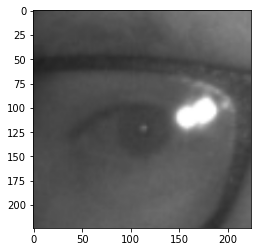

close


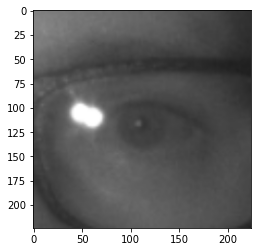

Open


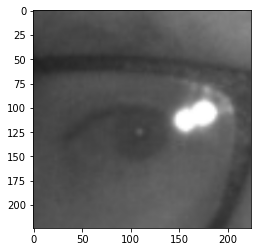

close


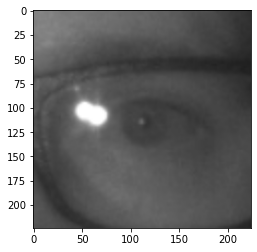

Open


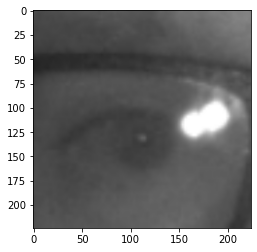

close


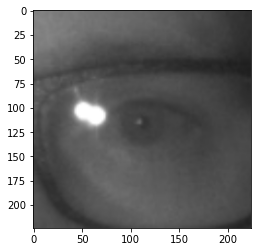

Open


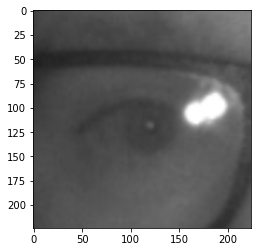

close


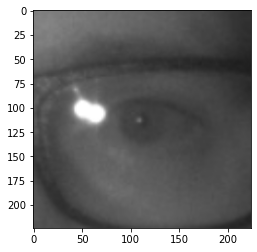

Open


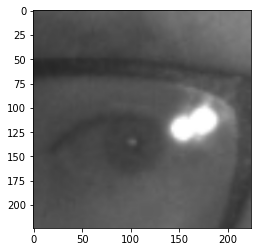

Open


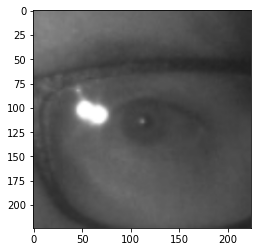

Open


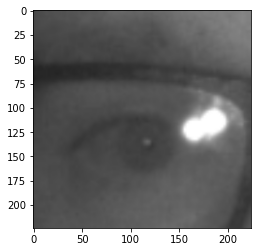

close


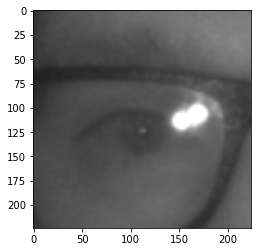

close


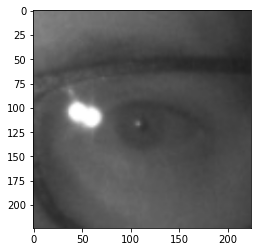

Open


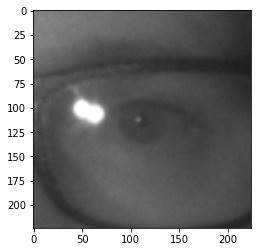

Open


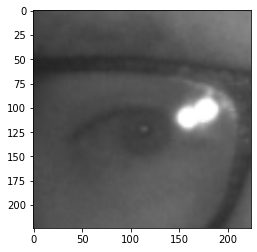

close


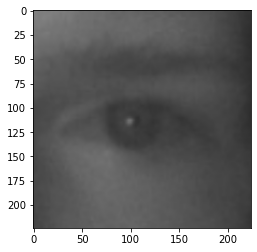

Open


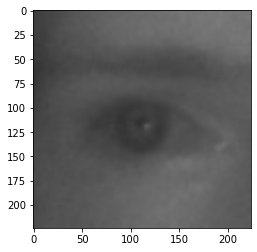

close


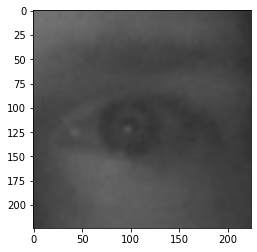

close


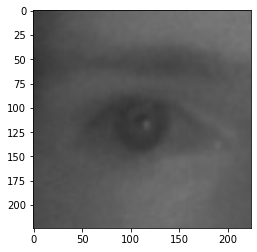

close


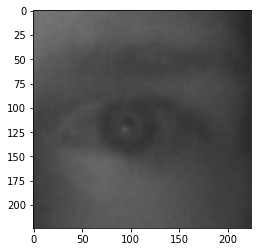

close


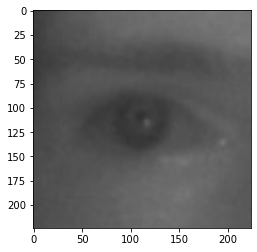

close


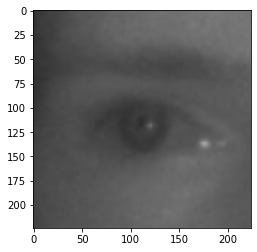

close


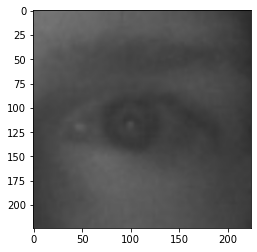

close


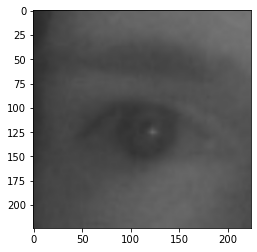

close


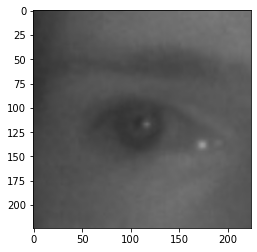

close


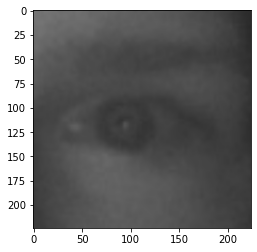

close


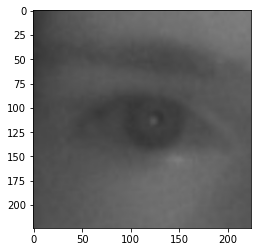

close


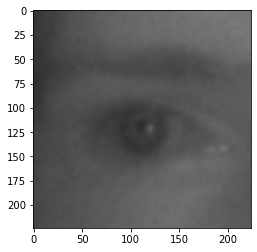

close


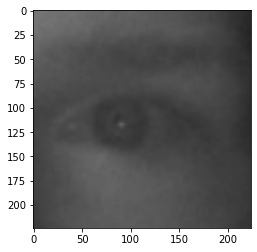

close


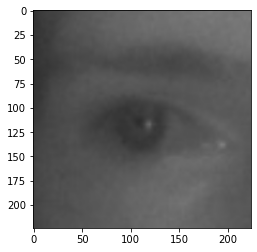

close


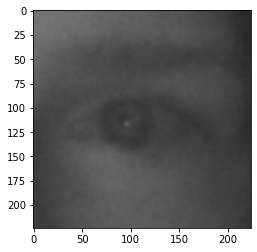

Open


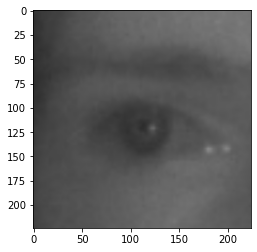

close


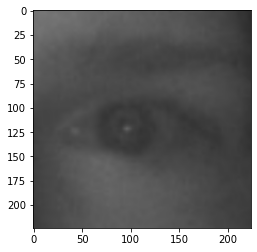

close


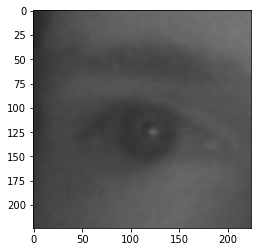

close


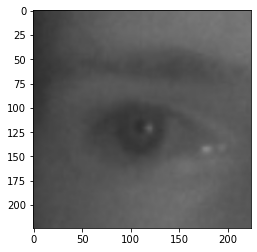

close


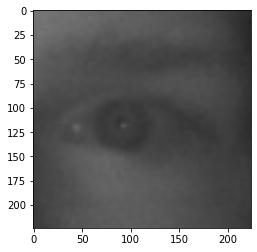

close


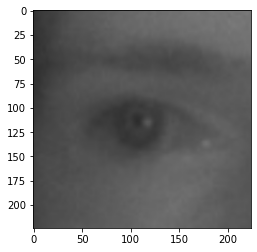

close


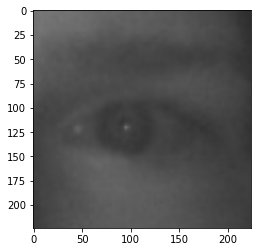

close


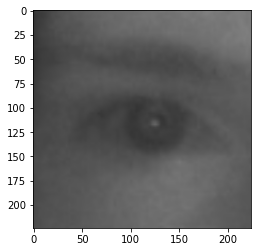

Open


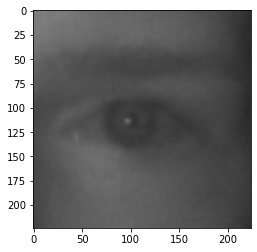

Open


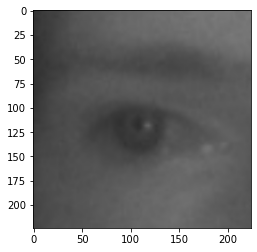

close


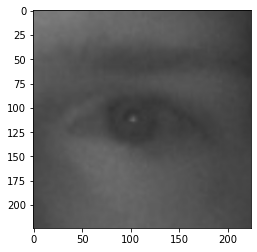

Open


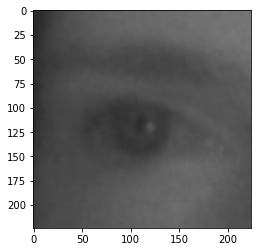

close


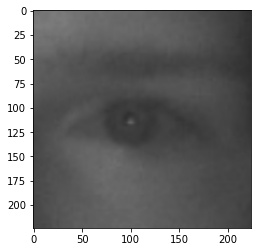

Open


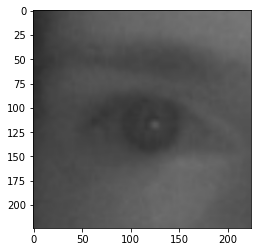

close


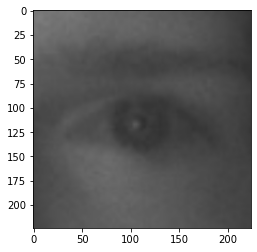

Open


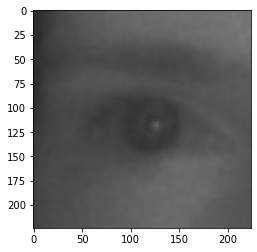

close


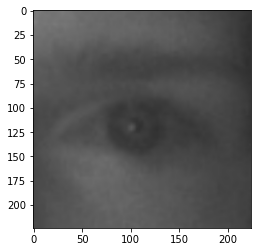

Open


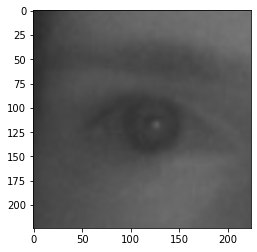

close


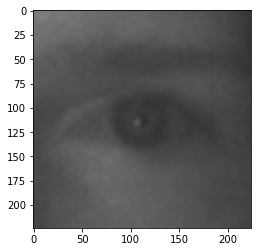

Open


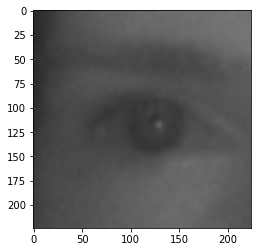

Open


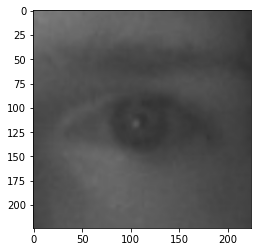

Open


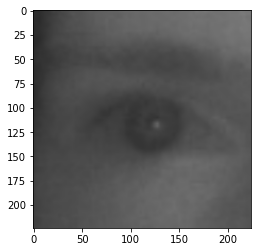

close


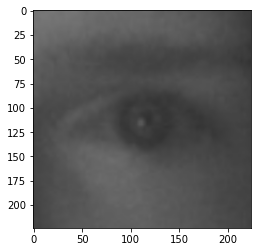

Open


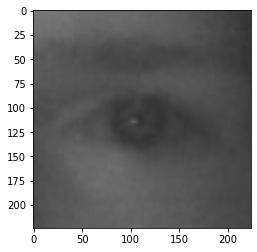

Open


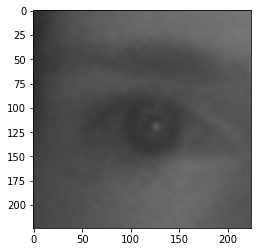

close


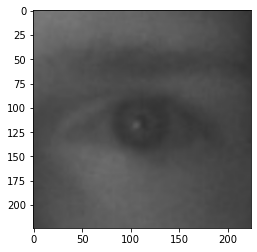

Open


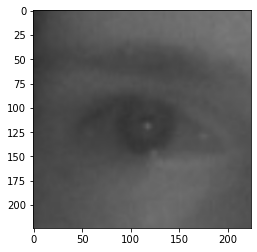

close


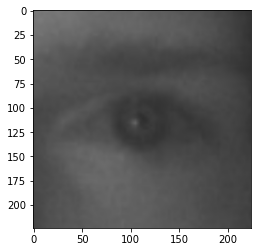

Open


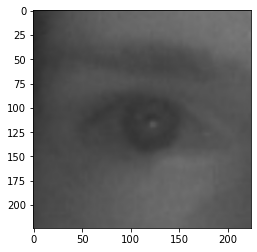

close


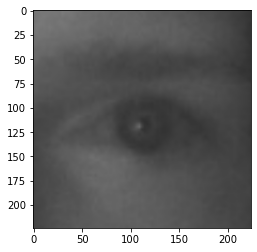

Open


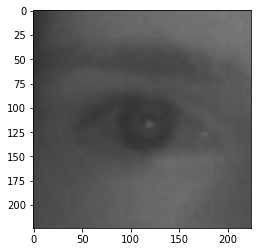

close


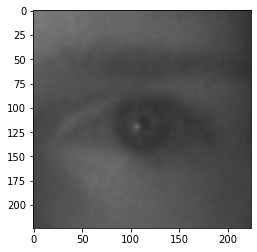

Open


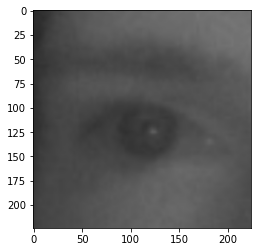

close


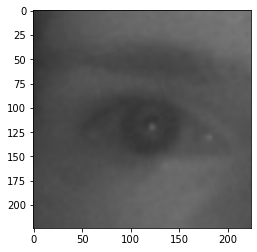

close


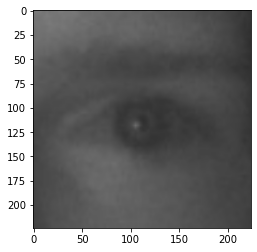

Open


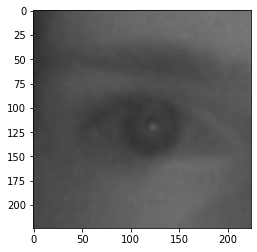

close


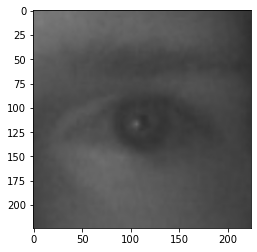

Open


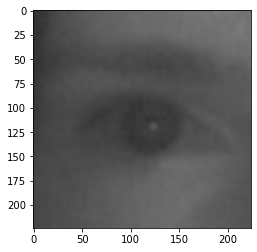

close


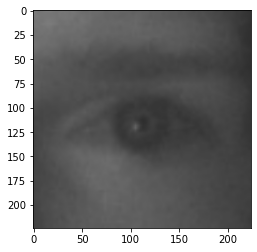

Open


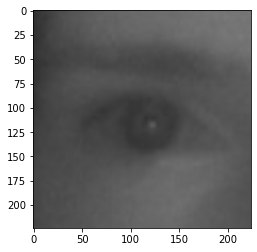

close


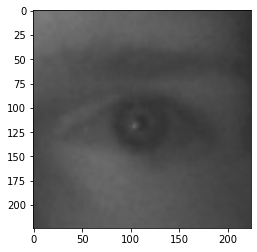

Open


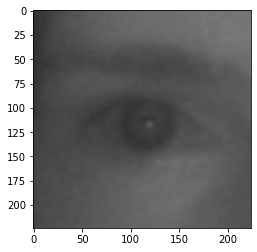

close


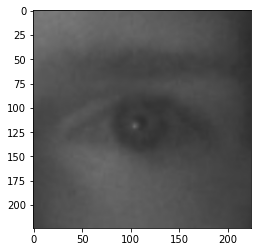

Open


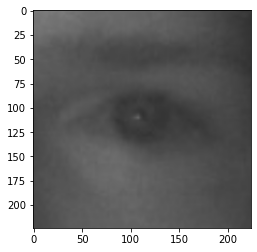

Open


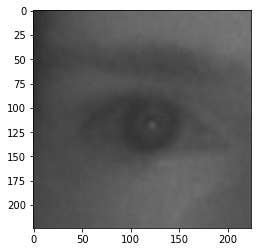

close


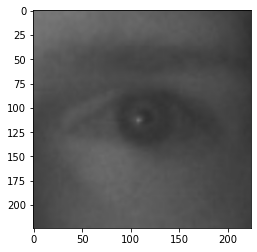

Open


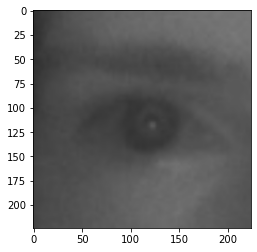

close


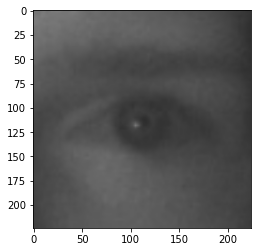

Open


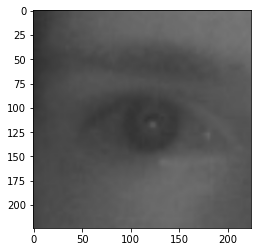

Open


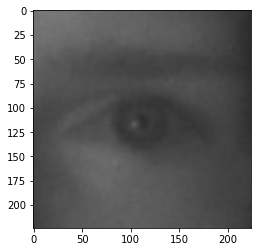

Open


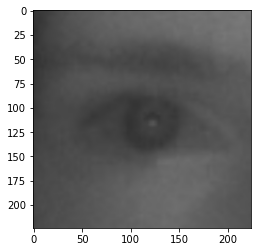

close


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
Data_dir="Test/"
path=os.path.join(Data_dir)
for img in os.listdir(path):
    try:
        img_array=cv2.imread(os.path.join(path,img),cv2.IMREAD_GRAYSCALE)
        backtorgb=cv2.cvtColor(img_array,cv2.COLOR_GRAY2RGB)
        new_array=cv2.resize(backtorgb,(224,224))
        plt.imshow(new_array)
        plt.show()
        X_input=np.array(new_array).reshape(1,224,224,3)
        X_input=X_input/225.0
        prediction=new_model.predict(X_input)
        if(prediction==1):
            print("Open")
        else:
            print("close")
    except Exception as e:
        
        pass

In [ ]:
import numpy as np
def lip_distance(shape):
    top_lip = shape[50:53]
    top_lip = np.concatenate((top_lip, shape[61:64]))

    low_lip = shape[56:59]
    low_lip = np.concatenate((low_lip, shape[65:68]))

    top_mean = np.mean(top_lip, axis=0)
    low_mean = np.mean(low_lip, axis=0)

    distance = abs(top_mean[1] - low_mean[1])
    return distance

In [ ]:
import winsound
frequency=2500
duration=1000
import cv2
from imutils import face_utils
import numpy as np
import dlib
YAWN_THRESH = 30
path="haarcascade_frontalface_default.xml"
faceCascade=cv2.CascadeClassifier(cv2.data.haarcascades+'haarcascade_frontalface_default.xml')
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')
cap=cv2.VideoCapture(1)
if not cap.isOpened():
    cap=cv2.VideoCapture(0)
if not cap.isOpened():
    raise IOError("Cannot open webcam")

counter=0
while True:
    ret,frame=cap.read()
    eye_cascade=cv2.CascadeClassifier(cv2.data.haarcascades+'haarcascade_eye.xml')
    gray=cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY)
    eyes=eye_cascade.detectMultiScale(gray,1.1,4)
    rects = faceCascade.detectMultiScale(gray, scaleFactor=1.1, 
		minNeighbors=5, minSize=(30, 30),
		flags=cv2.CASCADE_SCALE_IMAGE)
    for (x, y, w, h) in rects:
        rect = dlib.rectangle(int(x), int(y), int(x + w),int(y + h))
        shape = predictor(gray, rect)
        shape = face_utils.shape_to_np(shape)
        distance = lip_distance(shape)
        lip = shape[48:60]
        cv2.drawContours(frame, [lip], -1, (0, 255, 0), 1)
    for x,y,w,h in eyes:
        roi_gray=gray[y:y+h,x:x+h]
        roi_color=frame[y:y+h,x:x+w]
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0,255,0), 2)
        eyess=eye_cascade.detectMultiScale(roi_gray)
        if(len(eyess)==0):
            print("eyes are not detected")
        else:
            for(ex,ey,ew,eh) in eyess:
                eyes_roi=roi_color[ey: ey+eh, ex:ex + ew]
    font=cv2.FONT_HERSHEY_SIMPLEX
    final_image=cv2.resize(eyes_roi,(224,224))
    final_image=np.expand_dims(final_image,axis=0)
    final_image=final_image/255.0
    Predictions=new_model.predict(final_image)
    if(Predictions==1):
        status="Open Eyes"
        x1,y1,w1,h1=0,0,175,75
        cv2.rectangle(frame,(x1, x1), (x1+w1, y1+h1),(0,0,0), -1)
        cv2.putText(frame, 'Active' , (x1+int(w1/10),y1 + int(h1/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)
    else:
        counter = counter+1
        status = "Closed Eyes"
        cv2.rectangle(frame,(x, y), (x+w, y+h),(0,0,255), 2)
        if(counter>5):
            x1,y1,w1,h1=0,0,175,75
            cv2.rectangle(frame,(x1, x1), (x1+w1, y1+h1),(0,0,0), -1)
            cv2.putText(frame, 'Sleep Alert!!' , (x1+int(w1/10),y1 + int(h1/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,255), 2)
            winsound.Beep(frequency, duration)
            counter=0
    if (distance > YAWN_THRESH):
        print("distance=",distance)
        cv2.rectangle(frame,(x1, x1), (x1+w1, y1+h1),(0,0,0), -1)
        cv2.putText(frame, 'Yawn Alert!!' , (x1+int(w1/10),y1 + int(h1/2)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,255), 2)
        winsound.Beep(frequency, duration)
        
                
    cv2.imshow('Drowsiness detection system',frame)
    if cv2.waitKey(2) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()